# Detecção em imagens

Problemas de classificação de imagem podem ser considerados aplicações simples, uma vez que não incluem localização dos objetos de interesse. Para isso, é necessário adicionar outras camadas de complexidade às redes, tornando elas capazes de reconhecer múltiplos objetos e suas localizações na imagem. Esse tipo de tarefa é chamada de *detecção de objetos*.

As tarefas que envolvem detecção de objetos consistem em localizar um ou mais objetos na imagem e classificar esses objetos. Isso é feito utilizando *caixas delimitadoras* (ou *bounding boxes*) em volta de um objeto que corresponda a uma das classes de interesse. Para cada objeto na imagem, uma caixa sera utilizada para determinar sua posição. A caixa delimitadora é retangular e é determinada pela coordenada $(x,y)$ do centro da caixa, juntamente com sua altura e largura. Logo, há a necessidade de prever as coordenadas da caixa, e não apenas a classificação da imagem.

No caso de uma caixa de ancoragem com apenas um objeto, ao objeto na imagem de treino é associado uma grade de células que contém o centro do objeto. O output $y$ terá dimensão 3x3x8 (no caso de uma grade com 9 células). Para duas caixas de ancoragem, a imagem de treino será associada ao mesmo formato de grade anterior contendo os pontos centrais dos objetos e à caixa de ancoragem para a célula da grade com a maior interseção sobre a união (*IoU*) com o formato do objeto. Esse objeto é associado a um par (célula da grade, caixa de ancoragem). Neste caso, o output $y$ terá o formato 3x3x16 (ou 3x3x2x8).

## 1) Habilitando o darknet, cuda, etc

Neste etapa estão sendo habilitados os ambientes necessários para a execução do YOLO. Como esse projeto foi desenvolvido no Google Colab, e com o auxílio do Google Drive, as células a seguir são para clonar o repositório do Darknet e habilitar algumas funcionalidade. Caso o usuário esteja rodando esse código em um PC, é sugerido utilizar algum guia para a instalação dessas ferramentas.

In [ ]:
# clone darknet repo
!git clone https://github.com/AlexeyAB/darknet

# change makefile to have GPU and OPENCV enabled
%cd darknet
!sed -i 's/OPENCV=0/OPENCV=1/' Makefile
!sed -i 's/GPU=0/GPU=1/' Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile
!sed -i 's/CUDNN_HALF=0/CUDNN_HALF=1/' Makefile

In [ ]:
# verify CUDA
!/usr/local/cuda/bin/nvcc --version

In [ ]:
# make darknet (builds darknet so that you can then use the darknet executable file to run or train object detectors)
!make

In [ ]:
#Download yolov4 pre-trained weights
!wget https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v3_optimal/yolov4.weights

In [5]:
# define helper functions
def imShow(path):
  import cv2
  import matplotlib.pyplot as plt
  %matplotlib inline

  image = cv2.imread(path)
  height, width = image.shape[:2]
  resized_image = cv2.resize(image,(3*width, 3*height), interpolation = cv2.INTER_CUBIC)

  fig = plt.gcf()
  fig.set_size_inches(18, 10)
  plt.axis("off")
  plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
  plt.show()

# use this to upload files
def upload():
  from google.colab import files
  uploaded = files.upload() 
  for name, data in uploaded.items():
    with open(name, 'wb') as f:
      f.write(data)
      print ('saved file', name)

# use this to download a file  
def download(path):
  from google.colab import files
  files.download(path)

In [ ]:
#Fim da preparação
# This stops 'Run all' at this cell by causing an error
#assert False

## 2) Habilitando o Google Drive


In [ ]:
%cd ..
from google.colab import drive
drive.mount('/content/gdrive')

# this creates a symbolic link so that now the path /content/gdrive/My\ Drive/ is equal to /mydrive
!ln -s /content/gdrive/My\ Drive/ /mydrive
!ls /mydrive

# cd back into the darknet folder to run detections
%cd darknet

## 3) Custom detector

Nesta etapa é realizado o treinamento do detector. Como o custo computacional é alto, o processo é realizado pouco a pouco até atingir 6000 épocas. Depois de cada período treinamento uma avaliação é feita para que se tenha alguma noção de como o modelo está desempenhando.

In [ ]:
# this is where my datasets are stored within my Google Drive (I created a yolov4 folder to store all important files for custom training) 
!ls /mydrive/yolov4

# copy over both datasets into the root directory of the Colab VM (comment out test.zip if you are not using a validation dataset)
!cp /mydrive/yolov4/obj.zip ../
!cp /mydrive/yolov4/test.zip ../

# unzip the datasets and their contents so that they are now in /darknet/data/ folder
!unzip ../obj.zip -d data/
!unzip ../test.zip -d data/

In [8]:
# upload the custom .cfg back to cloud VM from Google Drive
!cp /mydrive/yolov4/yolov4-obj.cfg ./cfg

In [9]:
# upload the obj.names and obj.data files to cloud VM from Google Drive
!cp /mydrive/yolov4/obj.names ./data
!cp /mydrive/yolov4/obj.data  ./data

In [10]:
# upload the generate_train.py and generate_test.py script to cloud VM from Google Drive
!cp /mydrive/yolov4/generate_train.py ./
!cp /mydrive/yolov4/generate_test.py ./

!python generate_train.py
!python generate_test.py

In [ ]:
# verify that the newly generated train.txt and test.txt can be seen in our darknet/data folder
!ls data/

In [ ]:
# pre-trained weights for convolutional layers
!wget https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v3_optimal/yolov4.conv.137

## Começo do treinamento

In [ ]:
# train your custom detector! (uncomment %%capture below if you run into memory issues or your Colab is crashing)
# %%capture
!./darknet detector train data/obj.data cfg/yolov4-obj.cfg yolov4.conv.137 -dont_show -map

In [ ]:
# show chart.png of how custom object detector did with training
imShow('chart.png')

In [ ]:
!./darknet detector train data/obj.data cfg/yolov4-obj.cfg  backup/yolov4-obj_1000.weights >> log/yolov4-obj.log -gpus 0,1


## Recomeçando o treinamento (1)

In [ ]:
# kick off training from where it last saved
!./darknet detector train data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights -dont_show

In [ ]:
imShow('chart.png')

## Recomeçando o treinamento (2)

In [ ]:
# kick off training from where it last saved
!./darknet detector train data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights -dont_show

## Recomeçando o treinamento (3)

In [ ]:
# kick off training from where it last saved
!./darknet detector train data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights -dont_show

In [ ]:
imShow('chart.png')

## Recomeçando o treinamento (4)

In [ ]:
# kick off training from where it last saved
!./darknet detector train data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights -dont_show

In [ ]:
imShow('chart.png')

## Recomeçando o treinamento (5)

In [ ]:
# kick off training from where it last saved
!./darknet detector train data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights -dont_show

In [ ]:
imShow('chart.png')

## Recomeçando o treinamento (6)

In [ ]:
!./darknet detector train data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights -dont_show

In [ ]:
imShow('chart.png')

## Recomeçando o treinamento (7)

In [ ]:
!./darknet detector train data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights -dont_show

In [ ]:
#até 5500 iterações
imShow('chart.png')

In [ ]:
#5500 até 6000 iterações
imShow('chart.png')

## Avaliando o modelo

### primeiras 1000 iterações

In [ ]:
!./darknet detector map data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights

### 1000 até 1500 iterações

In [ ]:
!./darknet detector map data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights

###1500 até 2000 iterações

In [ ]:
!./darknet detector map data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights

### 2000 até 3000 iterações

In [ ]:
!./darknet detector map data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_3000.weights

### 3000 até 4000 iterações

In [ ]:
!./darknet detector map data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights

### 4000 até 5000 iterações

In [ ]:
!./darknet detector map data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights

### 5000 até 6000 iterações

In [ ]:
!./darknet detector map data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights

Para as primeiras 1000 épocas as precisões para as classes *Capivara* e *Cachorro* já são superiores a 85\%, indicando um bom desempenho. A classe *Equino* possui as piores precisões durante todas as épocas, alcançando um máximo de 82.47\% na época 4000 e 81.41\% em 6000 iterações. Ao final das épocas as precisões de *Capivara* e *Cachorro* chegam a 91.74\% e 93.81\% respectivamente.

O desempenho geral do modelo foi avaliado utilizando como critério a medida de precisão geral (mAP), que indica quão acertivo é o modelo. O mAP para 1000 as primeiras 1000 épocas é 81.83\% e atinge seu valor mais ao final das 6000 iterações com 88.99\%. Pode-se perceber também um aumento no número de verdadeiros positivos (TP), e redução dos falsos positivos (FP) e falsos negativos (FN) conforme o número de épocas aumenta.

## 4) Testando em imagens

Quando aplicado em imagens, o modelo apresenta alta precisão na detecção dos animais nos casos em que há apenas uma classe na imagem. Isso inclui casos em que há múltiplos múltiplos cachorros, capivaras ou equinos na mesma imagem.

A seguir são apresentados alguns resultados.

O modelo é capaz de detectar os objetos tanto em casos simples, quanto em casos com vários objetos. É interessante notar também que o modelo é capaz de identificar diferentes raças como a classe cachorro. Como os pesos pré-treinados utilizados no treinamento do modelo foram obtidos em um conjunto de dados que utilizava fotos de cachorro, é possível que o bom desempenho esteja associado a esse fato.

A classe dos equinos, apesar de ter tido a pior performance utilizando o critério da precisão média (AP), tem um bom desempenho para a maioria das imagens em que o corpo do animal parece completo na imagem. Para alguns casos, mesmo imagens descentralizadas e com o objeto pequeno, o modelo desempenha de forma satisfatória. O modelo passa a desempenhar pior quando temos imagens que mostram apenas parte do animal, como por exemplo: imagens onde aparece apenas a cabeça do animal, ou imagens onde as patas aparecem encoberta por algum outro objeto (detectável ou não detectável). Uma possível explicação para o primeiro problema talvez seja o fato do conjunto de dados incluir diferentes animais para a classe *equino*. Essa classe incluia tanto cavalos, quanto mulas, burros, e animais similares. Já o segundo problema talvez esteja sendo causado pela natureza do conjunto de treinamento, que é composto, em sua maioria por imagens de corpo inteiro dos animais.

É importante apontar que como as imagens utilizadas na composição do conjunto de treinamento foram obtida através de uma extração de dados indiscriminado do Google, é possível que a inclusão de abstrações, como quadros e desenhos, estejam prejudicando o desempenho do modelo para alguns casos.

Para os casos em que o modelo tenta detectar capivaras, o modelo se comporta de forma irregular. Ele apresenta um bom desempenho em imagens onde o formato dos corpos das capivaras aparecem bem definido e imagens onde elas aparecem de frente. Nos casos em que os animais estão longe, não centralizados, ou a imagem não está bem focada, a classificação atribuída varia entre *capivara* e *cachorro*, e em raros casos *equino*. A última imagem mostra um dos problemas apresentados: enquanto a maior parte das capivaras é detectada com precisão no meio da imagem, a capivara mais a direita, e em menor foco, é classificada de forma errada. 

A classe das capivaras apresenta a particularidade de ser a única que não está presente nos pesos pré-treinados do MSCOCO. Isso pode ser uma explicação para o confundimento da detecção em alguns casos. Além disso, assim como no caso dos equinos, a natureza da obtenção das imagens permitiu que desenhos e figuras estivessem incluidas no conjunto final, o que pode ter diminuido a eficiência da detecção.


In [ ]:
%cd cfg
!sed -i 's/batch=64/batch=1/' yolov4-custom.cfg
!sed -i 's/subdivisions=16/subdivisions=1/' yolov4-custom.cfg
%cd ..

In [ ]:
!./darknet detector test data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights /mydrive/yolov4/images/capivaraalbina.jpg -thresh 0.3


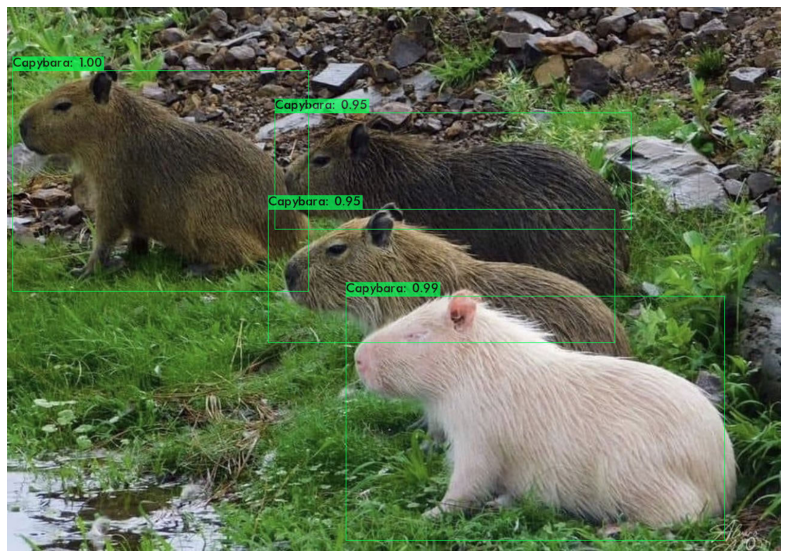

In [15]:
imShow('predictions.jpg')

In [ ]:
!./darknet detector test data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_best.weights /mydrive/yolov4/images/capivaracachorro.jpg -thresh 0.3


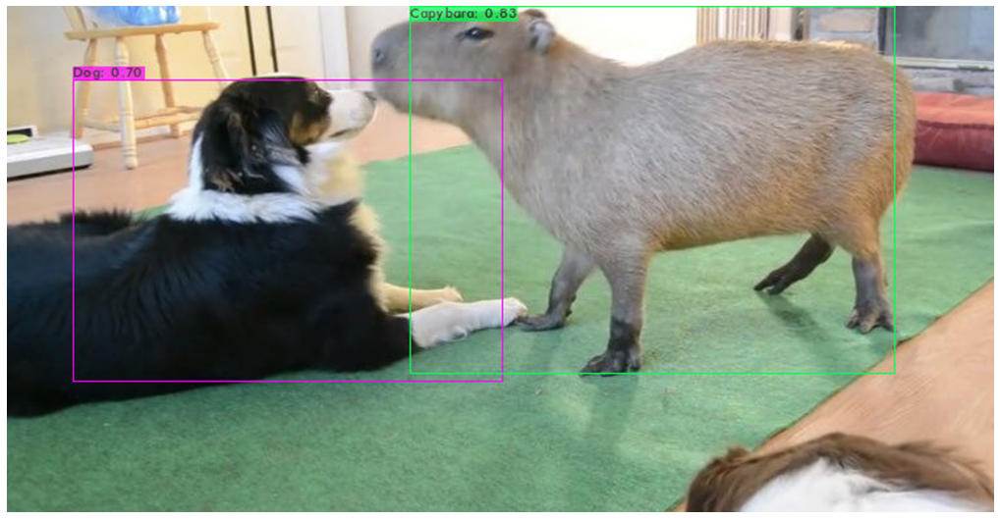

In [19]:
imShow('predictions.jpg')

In [ ]:
!./darknet detector test data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights /mydrive/yolov4/images/360_F_47461305_aIlxUE2UzAbdTqOhogTRHZ6hliHgHkWh.jpg -thresh 0.3


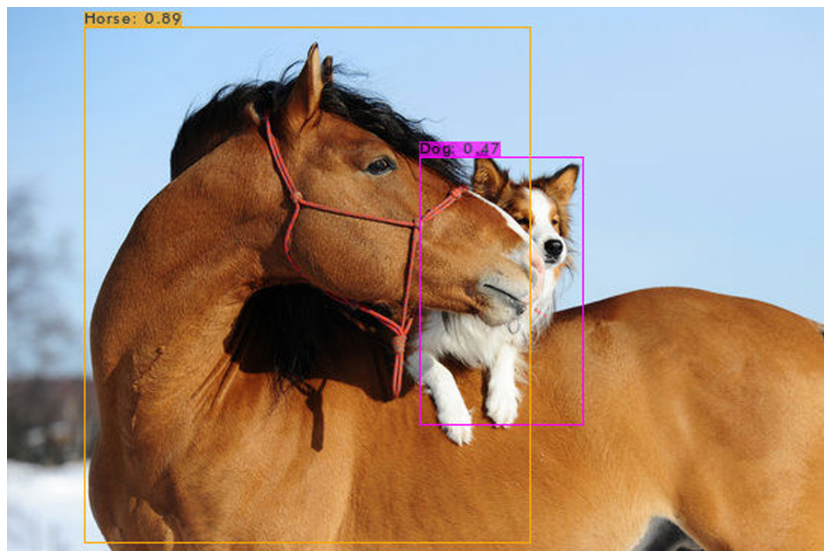

In [25]:
imShow('predictions.jpg')

In [ ]:
!./darknet detector test data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights /mydrive/yolov4/images/82aac310bbf3ee19f16bb483a1350f0a.jpg -thresh 0.3


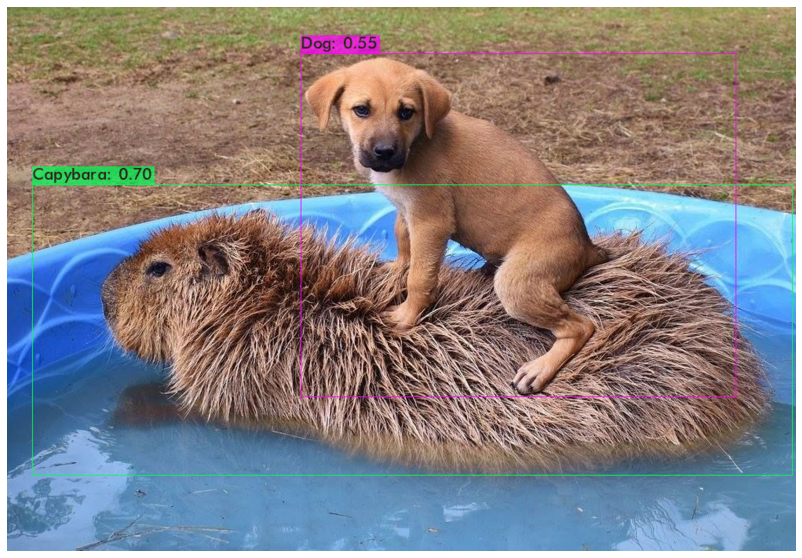

In [29]:
imShow('predictions.jpg')

In [ ]:
!./darknet detector test data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights /mydrive/yolov4/images/dog2.jpg -thresh 0.3


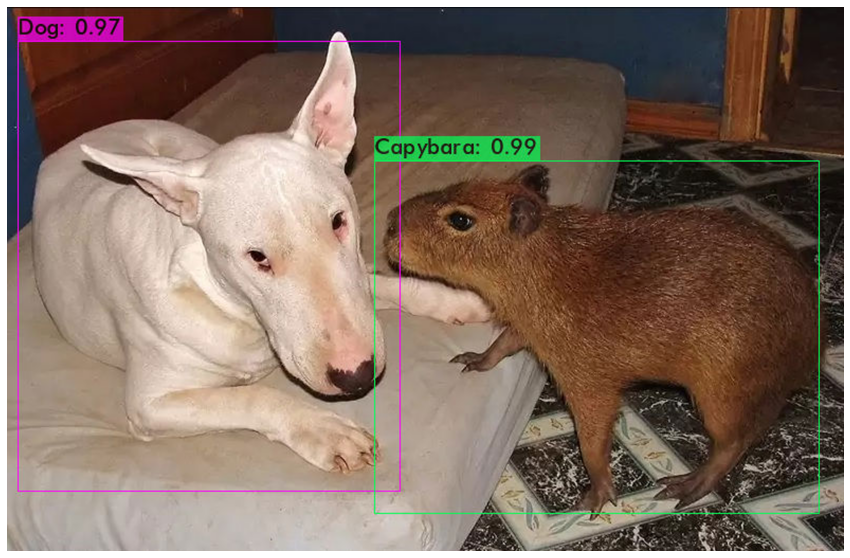

In [38]:
imShow('predictions.jpg')

In [ ]:
!./darknet detector test data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights /mydrive/yolov4/images/dog3.jpg -thresh 0.3


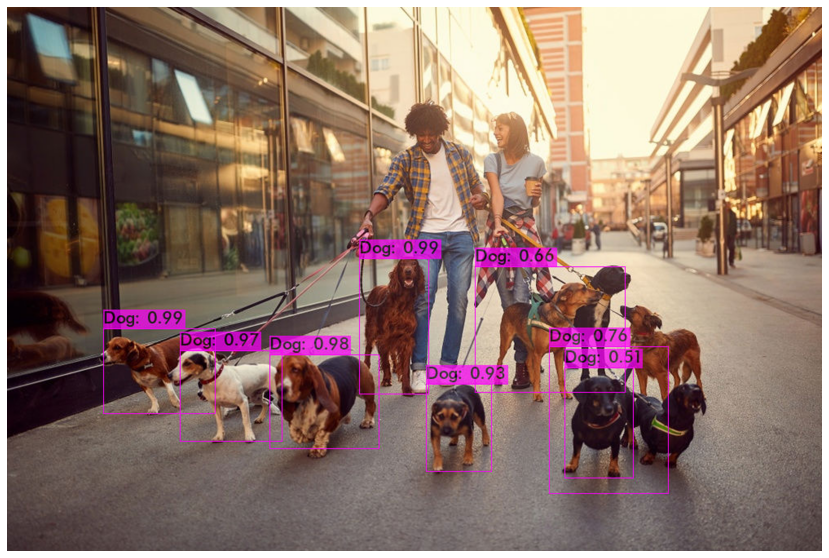

In [48]:
imShow('predictions.jpg')

In [ ]:
!./darknet detector test data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_best.weights /mydrive/yolov4/images/horse4.jpg -thresh 0.3


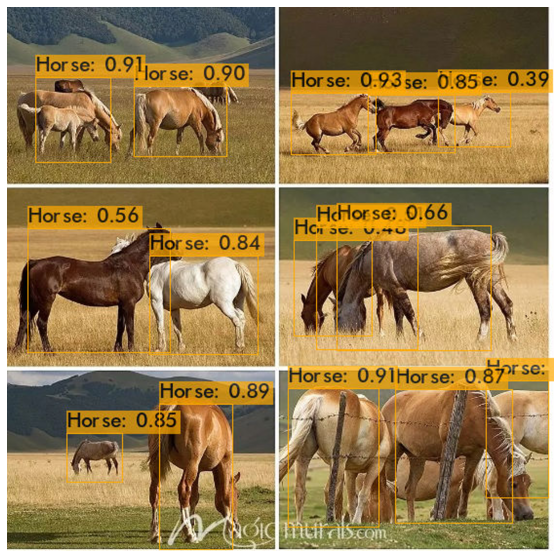

In [52]:
imShow('predictions.jpg')

In [ ]:
!./darknet detector test data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_best.weights /mydrive/yolov4/images/horse5.jpg -thresh 0.3


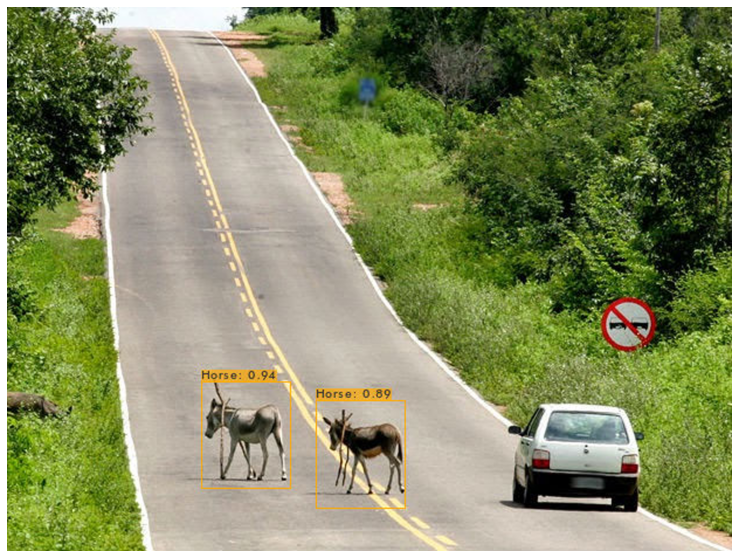

In [54]:
imShow('predictions.jpg')

In [ ]:
!./darknet detector test data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights /mydrive/yolov4/images/horse6.jpg -thresh 0.3


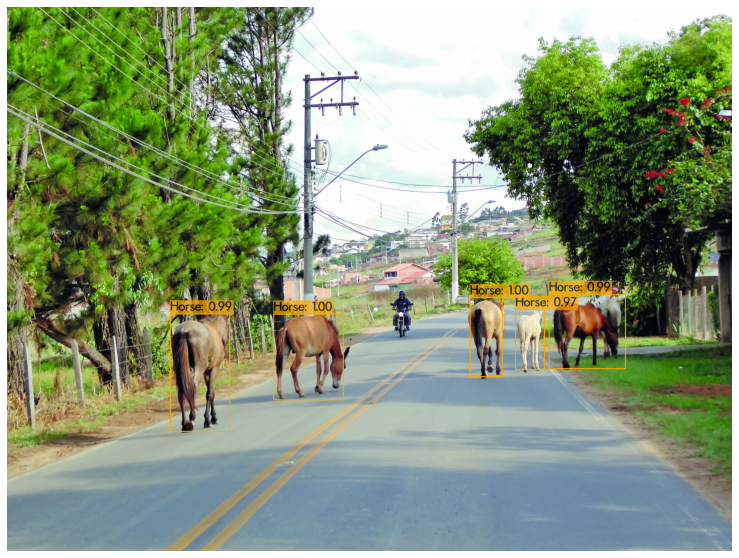

In [56]:
imShow('predictions.jpg')

In [ ]:
!./darknet detector test data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights /mydrive/yolov4/images/cap2.jpg -thresh 0.3


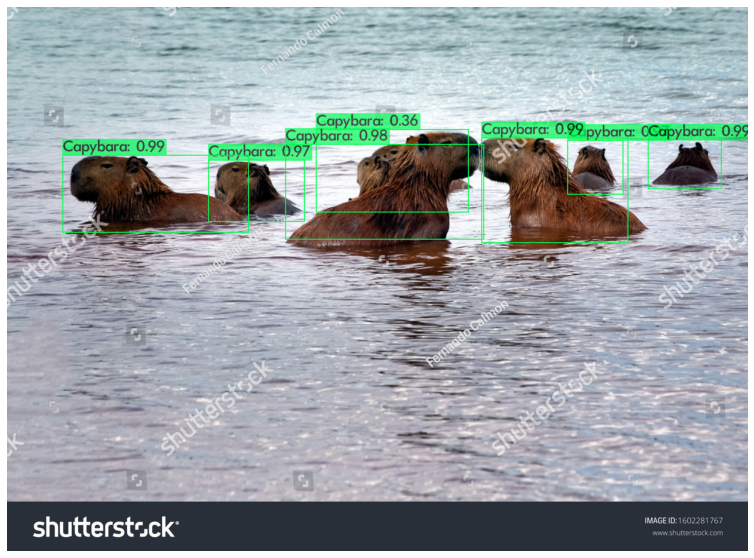

In [58]:
imShow('predictions.jpg')

In [ ]:
!./darknet detector test data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_final.weights /mydrive/yolov4/images/cap5.jpg -thresh 0.3


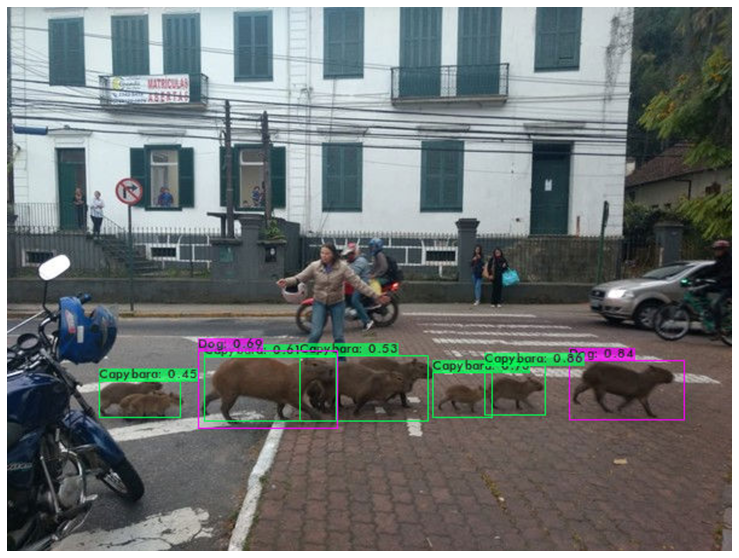

In [60]:
imShow('predictions.jpg')

## 5) Testando em videos

O modelo também foi testado em vídeos. Alguns desses teste estão disponíveis nos links https://youtu.be/To19RpiEq44, https://youtu.be/yS5NTN_HdOg e https://youtu.be/v8HjYRd96XA. O primeiro vídeo mostra capivaras em várias posições e profundidades, e o modelo é capaz de realizar a detecção na maior parte do tempo. Ele apresenta dificuldade em realizar a detecção quando as capivaras estão longe do centro do video ou não aparecem totalmente na filmagem. As caixas delimitadoras compreendem apenas a parte das capivaras que está acima da água e a parte abaixo dagua, ainda que visível, não é capturada na detecção. Isso parece indicar que marcações desse tipo são raras no conjunto de treino. No segundo vídeo o desempenho do modelo também foi muito bom. Ele é capaz de detectar tanto os cachorros quanto o cavalo de forma correta durante quase toda duração. No último vídeo o modelo falha na tarefa de classificação, mas executa bem a tarefa de detecção dos animais. Isto é, apesar de apontar a classe errada do animal, ele ainda é capaz de detectar o objeto como uma das classes e gerar uma caixa para ele. As capivaras são detectadas consistentemente apenas nos quadros em que os animais estão estáticos. Nos outros quadros o modelo classifica a capivara com quase 100\% de certeza como a classe cachorro. O cachorro parece ser bem detectado na maior parte do video, mas quando se distancia do ponto da filmagem passa a ser classificado como equino. O mesmo ocorre com a capivara nesta situação. 

In [ ]:
# need to set our custom cfg to test mode 
%cd cfg
!sed -i 's/batch=64/batch=1/' yolov4-obj.cfg
!sed -i 's/subdivisions=16/subdivisions=1/' yolov4-obj.cfg
%cd ..

/content/darknet/cfg
/content/darknet


In [ ]:
!./darknet detector demo data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights -dont_show /mydrive/yolov4/capybaraorange.mp4 -i 0 -out_filename /mydrive/yolov4/results.avi

In [ ]:
!./darknet detector demo data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights -dont_show /mydrive/yolov4/horsefart.mp4 -i 0 -out_filename /mydrive/yolov4/results2.avi

In [ ]:
!./darknet detector demo data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights -dont_show /mydrive/yolov4/horsefart.mp4 -i 0 -out_filename /mydrive/yolov4/results2_2.avi

In [ ]:
!./darknet detector demo data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights -dont_show /mydrive/yolov4/capybarascompilation.mp4 -i 0 -out_filename /mydrive/yolov4/results3.avi

In [ ]:
!./darknet detector demo data/obj.data cfg/yolov4-obj.cfg /mydrive/yolov4/backup/yolov4-obj_last.weights -dont_show /mydrive/yolov4/capybaravsdog.mp4 -i 0 -out_filename /mydrive/yolov4/results4.avi